In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from pathlib import Path

from model_util import *
from neuron_model import *

from sklearn.metrics import *
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from torch import nn, optim
import torch.nn.functional as F

from matplotlib.colors import LogNorm

In [2]:
df_Ch001 = pd.read_pickle(Path("../process/Ch001.pkl"))
df_Ch009 = pd.read_pickle(Path("../process/Ch009.pkl"))
df_Ch020 = pd.read_pickle(Path("../process/Ch020.pkl"))
df_Ch022 = pd.read_pickle(Path("../process/Ch022.pkl"))

### evaluation parameters

In [3]:
df_input=[df_Ch001, df_Ch020, df_Ch009]
log_noise=1
network= "cnn_v2"
model= CNN_v2()
path_model= ".\saved_models\CNN_v2_284.pt"

In [4]:
if network == "fnn":
    data_scaled, target_scaled, output_scaler = FNN_scale_format(df_input, df_Ch022, log_noise=log_noise)
elif network == "cnn":
    data_scaled, target_scaled, output_scaler = CNN_scale_format(df_input, df_Ch022, log_noise=log_noise)
elif network == "cnn_v2":
    data_scaled, target_scaled, output_scaler = CNN_v2_scale_format(df_input, df_Ch022, log_noise=log_noise)
'''
    important: df_Ch022 is raw data, value has not been changed for logarithm.
    log_noise is an hyperparameters who scale data to be >0                                                                                                                                                 '''

'\n    important: df_Ch022 is raw data, value has not been changed for logarithm.\n    log_noise is an hyperparameters who scale data to be >0                                                                                                                                                 '

In [5]:
size=len(df_Ch022.index)
split = data_split(network, df_Ch022)* 40

#needed because df_Ch022 is not processed for log
if network == "cnn_v2":
    a=target_scaled.detach().numpy()
    b = [a[i] for i in range(len(a))]
    c = np.concatenate(b)
    y_test = output_scaler.inverse_transform(c)[:4720]
    y_test = 10 ** y_test
else:
    y_test = output_scaler.inverse_transform(target_scaled)[:4720]
    y_test = 10 ** y_test

### loading model

In [6]:
model.load_state_dict(torch.load(Path(path_model)))
model.eval()
print("Model Loaded")

Model Loaded


In [7]:
model.to("cpu")
y_pred_test=model(data_scaled[:]).detach().numpy()
if network =="cnn_v2":
    a= y_pred_test
    b = [a[i] for i in range(len(a))]
    c = np.concatenate(b)
    y_pred_test = output_scaler.inverse_transform(c)[:4720]
    y_pred_test = 10 ** y_pred_test

else: 
    y_pred_test= output_scaler.inverse_transform(y_pred_test)
    y_pred_test=10 ** y_pred_test

### results

In [8]:
print("MAE :", mean_absolute_error(y_test, y_pred_test))
print("MSE :", mean_squared_error(y_test, y_pred_test))
print("RMSE :", mean_squared_error(y_test, y_pred_test, squared= False))

MAE : 12.792238
MSE : 4005594.0
RMSE : 422.53677


In [9]:
    p=17
    plt.figure()
    plt.plot(df_Ch022.index[:4720], y_test[:,p], color="green")
    plt.semilogy(df_Ch022.index[:4720], y_pred_test[:,p], color="red")
    plt.title("test vs predict at L={}".format(df_Ch022.columns[p]))
    plt.legend("tp")


    plt.show()

ValueError: x and y must have same first dimension, but have shapes (4722,) and (4720,)

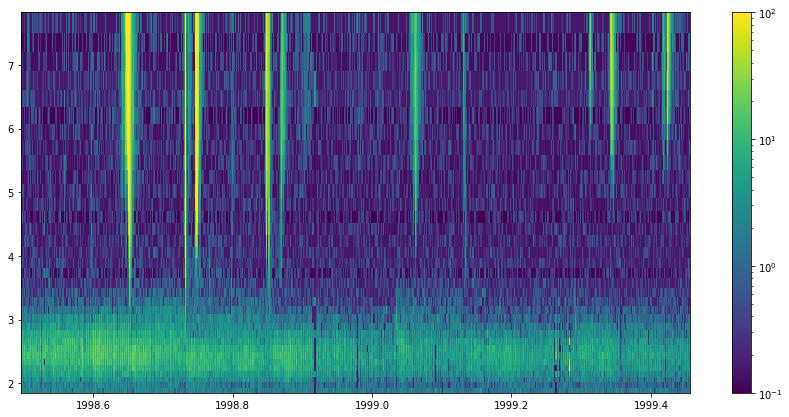

In [11]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:4720],
    df_Ch022.columns,
    y_test.T,
    norm=LogNorm(1e-1,1e2),
    shading="auto",
)
plt.colorbar()
plt.show()

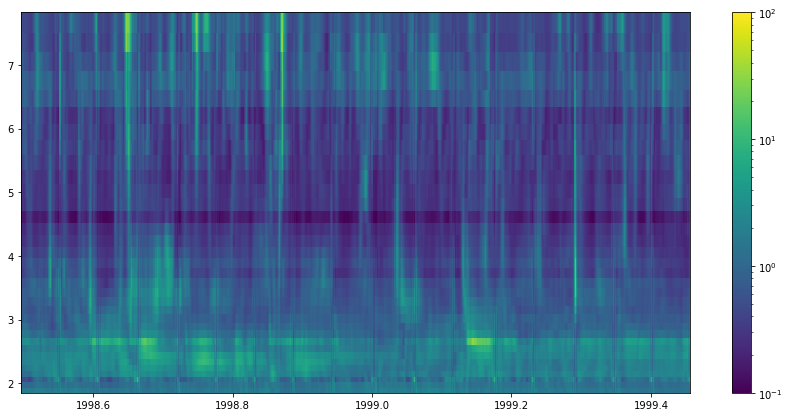

In [12]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:4720],
    df_Ch022.columns,
   y_pred_test.T,
    norm=LogNorm(1e-1, 1e2),
    shading="auto",
)
plt.colorbar()
plt.show()

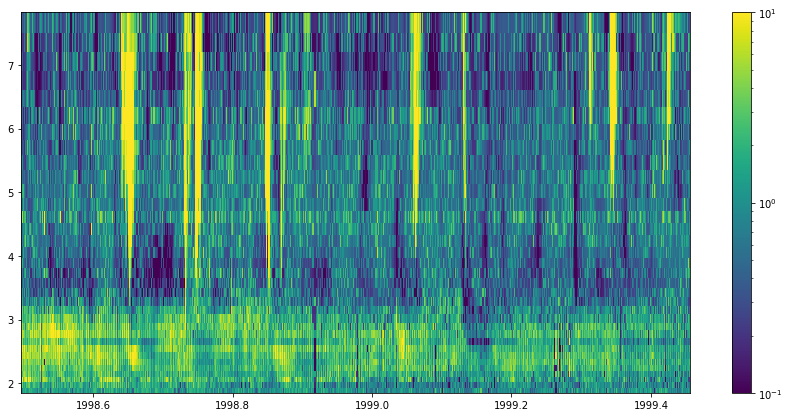

In [13]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:split],
    df_Ch022.columns,
    y_test.T /  y_pred_test.T,
    norm=LogNorm(1e-1, 10),
    shading="auto",
)
plt.colorbar()
plt.show()

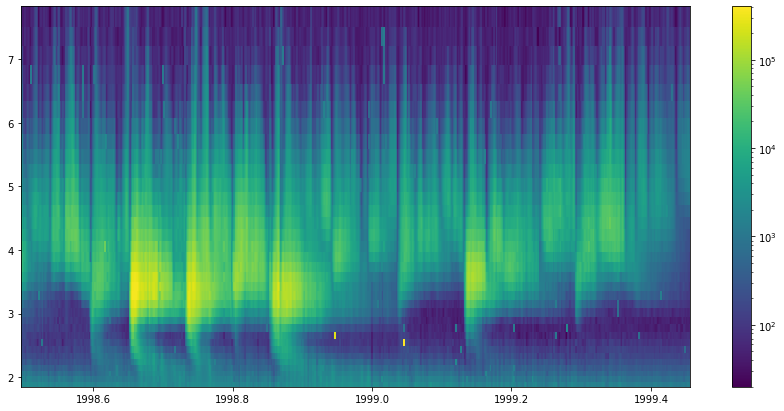

In [14]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch020.index[:split],
    df_Ch020.columns,
    df_Ch020.iloc[:split].values.T,
    norm=LogNorm(),
    shading="auto",
)
plt.colorbar()
plt.show()

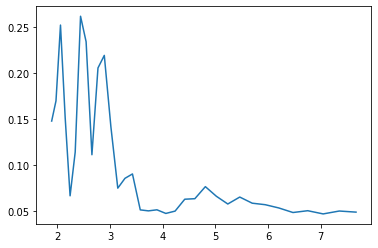

In [15]:
plt.plot(df_Ch022.columns,mean_squared_error(y_test, y_pred_test, multioutput="raw_values", squared= False)/y_test.max(axis=0))
# plt.savefig(Path("../Results/log_CNN_v1_ratio_RMSE_Max"), facecolor="w")


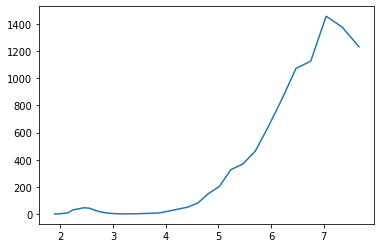

In [16]:
plt.plot(df_Ch022.columns, mean_squared_error(y_test,y_pred_test, multioutput="raw_values"))